In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
from datetime import datetime, date


In [2]:
df = pd.read_csv(r"C:\Users\USER\Desktop\ALL MY TASKS\TSI DATA SCIENCE\Datasets\CSV Datasets\eth_usd_max.csv")
df.head(10)

,snapped_at,price,market_cap,total_volume
0,2015-08-07 00:00:00 UTC,2.831620,0.000000e+00,9.062200e+04
1,2015-08-08 00:00:00 UTC,1.330750,8.033948e+07,3.680700e+05
2,2015-08-10 00:00:00 UTC,0.687586,4.155631e+07,4.004641e+05
3,2015-08-11 00:00:00 UTC,1.067379,6.453901e+07,1.518998e+06
4,2015-08-12 00:00:00 UTC,1.256613,7.601326e+07,2.073893e+06
5,2015-08-13 00:00:00 UTC,1.825395,1.104688e+08,4.380143e+06
6,2015-08-14 00:00:00 UTC,1.825975,1.105553e+08,4.355618e+06
7,2015-08-15 00:00:00 UTC,1.670950,1.012152e+08,2.519633e+06
8,2015-08-16 00:00:00 UTC,1.476607,8.948094e+07,3.032658e+06
9,2015-08-17 00:00:00 UTC,1.203871,8.731339e+07,1.880092e+06


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3185 entries, 0 to 3184
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   snapped_at    3185 non-null   object 
 1   price         3185 non-null   float64
 2   market_cap    3184 non-null   float64
 3   total_volume  3185 non-null   float64
dtypes: float64(3), object(1)
memory usage: 99.7+ KB


In [4]:
df.isnull().sum()

snapped_at      0
price           0
market_cap      1
total_volume    0
dtype: int64

In [5]:
df.shape

(3185, 4)

# Our Dataset
Our dataset has 3185 rows and 4 columns. The four columns are snapped_at which describes the date when the data was taken, price, a float object which describes the price of our cryptocurrency; market_cap float object which describes the highest price of cryptocurrency in the market on a particular day. Market cap is measured by multiplying token price with the circulating supply of ETH tokens (120 Million tokens are tradable on the market today); total_volume, also a float object is the total amount of ethereum in 24 hours.

More information can be found at https://www.coingecko.com/en/coins/ethereum

In [6]:
df1 = df.rename(
    columns={
        "snapped_at": "date",
        "price": "price",
        "market_cap": "market_cap",
        "total_volume":"total_volume",
    }
)

In [7]:
df1.head(10)

,date,price,market_cap,total_volume
0,2015-08-07 00:00:00 UTC,2.831620,0.000000e+00,9.062200e+04
1,2015-08-08 00:00:00 UTC,1.330750,8.033948e+07,3.680700e+05
2,2015-08-10 00:00:00 UTC,0.687586,4.155631e+07,4.004641e+05
3,2015-08-11 00:00:00 UTC,1.067379,6.453901e+07,1.518998e+06
4,2015-08-12 00:00:00 UTC,1.256613,7.601326e+07,2.073893e+06
5,2015-08-13 00:00:00 UTC,1.825395,1.104688e+08,4.380143e+06
6,2015-08-14 00:00:00 UTC,1.825975,1.105553e+08,4.355618e+06
7,2015-08-15 00:00:00 UTC,1.670950,1.012152e+08,2.519633e+06
8,2015-08-16 00:00:00 UTC,1.476607,8.948094e+07,3.032658e+06
9,2015-08-17 00:00:00 UTC,1.203871,8.731339e+07,1.880092e+06


In [8]:
df1['date'] = pd.to_datetime(df1['date'])

In [9]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3185 entries, 0 to 3184
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   date          3185 non-null   datetime64[ns, UTC]
 1   price         3185 non-null   float64            
 2   market_cap    3184 non-null   float64            
 3   total_volume  3185 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(3)
memory usage: 99.7 KB


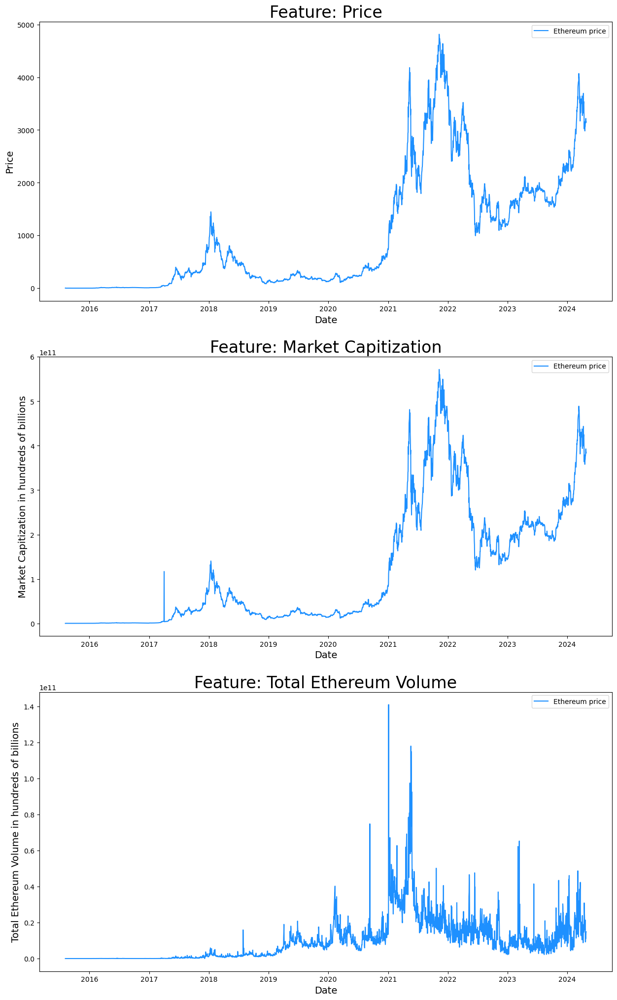

In [10]:
import warnings
warnings.filterwarnings("ignore")
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 25))  # Unpack the tuple

sns.lineplot(data=df1, x=df1.date, y=df1.price, ax=ax[0], color='dodgerblue', label="Ethereum price")
ax[0].set_title('Feature: Price', fontsize=24)
ax[0].set_ylabel(ylabel='Price', fontsize=14)
ax[0].set_xlabel(xlabel='Date', fontsize=14)

sns.lineplot(data=df1, x=df1.date, y=df1.market_cap.fillna(df['market_cap'].mean()), ax=ax[1], color='dodgerblue', label="Ethereum price")
ax[1].set_title('Feature: Market Capitization', fontsize=24)
ax[1].set_ylabel(ylabel='Market Capitization in hundreds of billions', fontsize=14)
ax[1].set_xlabel(xlabel='Date', fontsize=14)

sns.lineplot(data=df1, x=df1.date, y=df1.total_volume, ax=ax[2], color='dodgerblue', label="Ethereum price")
ax[2].set_title('Feature: Total Ethereum Volume', fontsize=24)
ax[2].set_ylabel(ylabel='Total Ethereum Volume in hundreds of billions', fontsize=14)
ax[2].set_xlabel(xlabel='Date', fontsize=14)

# for i in range(3):
#     ax[i].set_xlim([date(2022, 4, 1), date(2024, 4, 30)])

plt.show()

In [11]:
df1['price'].max()

4815.004634322234

In [12]:
df1['price'].min()

0.4329785990312485

In [13]:
df1['market_cap'].max()

571665766496.0859

In [14]:
df1['market_cap'].min()

0.0

In [15]:
df1['total_volume'].max()

140906534190.58786

In [16]:
df1['total_volume'].min()

87074.79961764446

In [17]:
# Sort values by timestamp (not necessary in this case)
df1 = df1.sort_values(by='date')

# Check time intervals
df1['Time_Interval'] = df1.date - df1.date.shift(1)

df1[['date', 'Time_Interval']].head(20)

,date,Time_Interval
0,2015-08-07 00:00:00+00:00,NaT
1,2015-08-08 00:00:00+00:00,1 days
2,2015-08-10 00:00:00+00:00,2 days
3,2015-08-11 00:00:00+00:00,1 days
4,2015-08-12 00:00:00+00:00,1 days
5,2015-08-13 00:00:00+00:00,1 days
6,2015-08-14 00:00:00+00:00,1 days
7,2015-08-15 00:00:00+00:00,1 days
8,2015-08-16 00:00:00+00:00,1 days
9,2015-08-17 00:00:00+00:00,1 days


In [18]:
df1.head()

,date,price,market_cap,total_volume,Time_Interval
0,2015-08-07 00:00:00+00:00,2.831620,0.000000e+00,9.062200e+04,NaT
1,2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days
2,2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,2 days
3,2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days
4,2015-08-12 00:00:00+00:00,1.256613,7.601326e+07,2.073893e+06,1 days


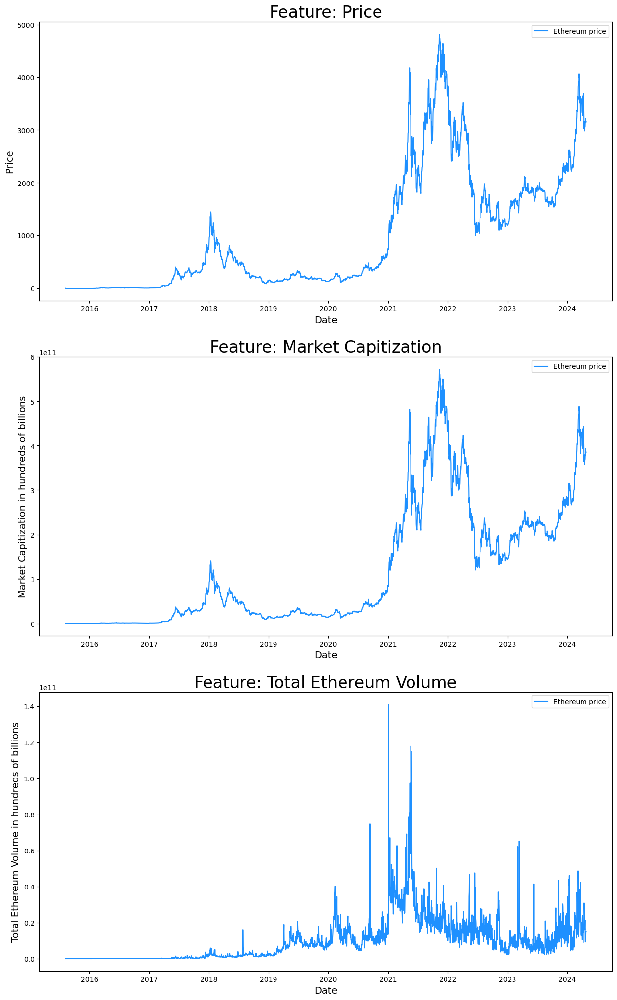

In [19]:
import warnings
warnings.filterwarnings("ignore")
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 25))  # Unpack the tuple

sns.lineplot(data=df1, x=df1.date, y=df1.price, ax=ax[0], color='dodgerblue', label="Ethereum price")
ax[0].set_title('Feature: Price', fontsize=24)
ax[0].set_ylabel(ylabel='Price', fontsize=14)
ax[0].set_xlabel(xlabel='Date', fontsize=14)

sns.lineplot(data=df1, x=df1.date, y=df1.market_cap, ax=ax[1], color='dodgerblue', label="Ethereum price")
ax[1].set_title('Feature: Market Capitization', fontsize=24)
ax[1].set_ylabel(ylabel='Market Capitization in hundreds of billions', fontsize=14)
ax[1].set_xlabel(xlabel='Date', fontsize=14)

sns.lineplot(data=df1, x=df1.date, y=df1.total_volume, ax=ax[2], color='dodgerblue', label="Ethereum price")
ax[2].set_title('Feature: Total Ethereum Volume', fontsize=24)
ax[2].set_ylabel(ylabel='Total Ethereum Volume in hundreds of billions', fontsize=14)
ax[2].set_xlabel(xlabel='Date', fontsize=14)

# for i in range(3):
#     ax[i].set_xlim([date(2022, 4, 1), date(2024, 4, 30)])

plt.show()

In [20]:
def fill_missing_dates(df1, date_col='date', time_interval_col='Time_Interval'):
    df1[date_col] = pd.to_datetime(df1[date_col])

    min_date = df1[date_col].min()
    max_date = df1[date_col].max()

    complete_date_range = pd.date_range(min_date, max_date, freq='D')

    df1 = df1.set_index(date_col).reindex(complete_date_range, fill_value=None)

    # Create a new DatetimeIndex with the desired frequency
    df1.index = pd.date_range(min_date, periods=len(df1), freq='D')  

    df1[time_interval_col] = (df1.index - df1.index.shift(1)) * -1

    return df1

# Apply the function
df1 = fill_missing_dates(df1, 'date', 'Time_Interval')

In [21]:
df1.head(10)

,price,market_cap,total_volume,Time_Interval
2015-08-07 00:00:00+00:00,2.831620,0.000000e+00,9.062200e+04,1 days
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days
2015-08-09 00:00:00+00:00,NaN,NaN,NaN,1 days
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days
2015-08-12 00:00:00+00:00,1.256613,7.601326e+07,2.073893e+06,1 days
2015-08-13 00:00:00+00:00,1.825395,1.104688e+08,4.380143e+06,1 days
2015-08-14 00:00:00+00:00,1.825975,1.105553e+08,4.355618e+06,1 days
2015-08-15 00:00:00+00:00,1.670950,1.012152e+08,2.519633e+06,1 days
2015-08-16 00:00:00+00:00,1.476607,8.948094e+07,3.032658e+06,1 days


In [22]:
df1['date'] = pd.date_range('2015-08-07','2024-04-26', freq='D')
df1 = df1.rename(
    columns={
        "date": "date",
        "price": "price",
        "market_cap": "market_cap",
        "total_volume":"total_volume",
        "Time_Interval":"time_interval"
    }
)
df1['date'] = pd.to_datetime(df1['date'])

In [23]:
df1.head()

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.831620,0.000000e+00,9.062200e+04,1 days,2015-08-07
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08
2015-08-09 00:00:00+00:00,NaN,NaN,NaN,1 days,2015-08-09
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11


In [24]:
df1.isnull().sum()

price            3
market_cap       4
total_volume     3
time_interval    0
date             0
dtype: int64

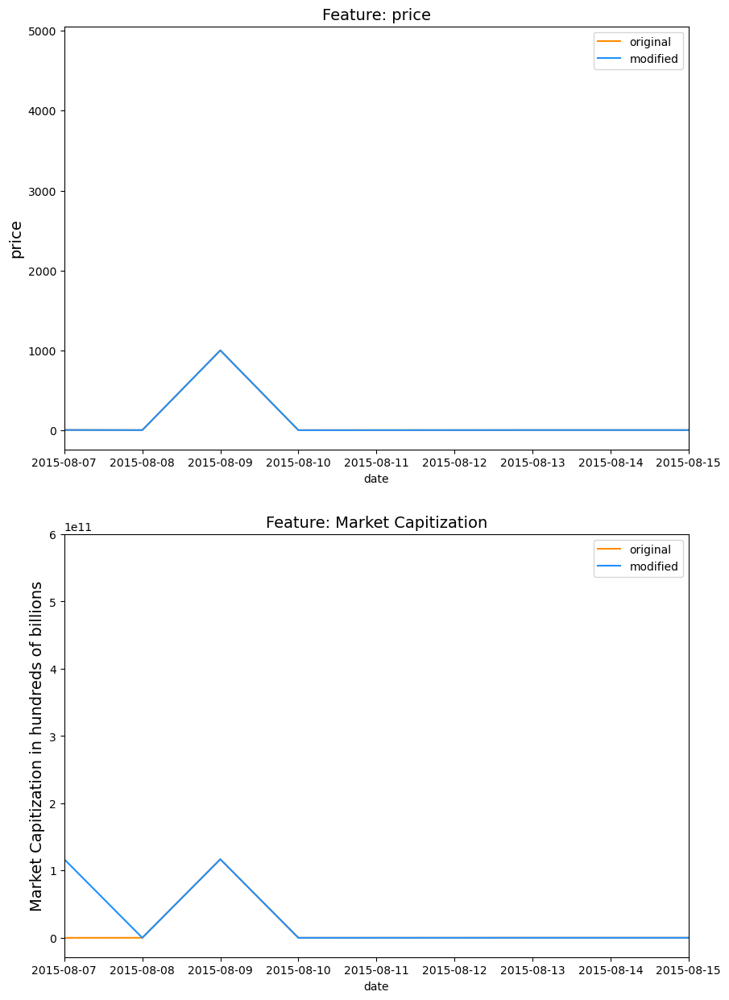

In [25]:
#Handling missing data
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 15))
old_df1_price = df1.price.copy()
df1['price'] = np.where((df1.price == 0),np.nan, df1.price)

sns.lineplot(x=df1.date, y=old_df1_price.fillna(df1['price'].mean()), ax=ax[0], color='darkorange', label = 'original')
sns.lineplot(x=df1.date, y=df1.price.fillna(df1['price'].mean()), ax=ax[0], color='dodgerblue', label = 'modified')
ax[0].set_title('Feature: price', fontsize=14)
ax[0].set_ylabel(ylabel='price', fontsize=14)

old_df1_market_cap = df1.market_cap.copy()
df1['market_cap'] = np.where((df1.market_cap == 0),np.nan, df1.market_cap)

sns.lineplot(x=df1.date, y=old_df1_market_cap.fillna(df1['market_cap'].mean()), ax=ax[1], color='darkorange', label = 'original')
sns.lineplot(x=df1.date, y=df1.market_cap.fillna(df1['market_cap'].mean()), ax=ax[1], color='dodgerblue', label = 'modified')
ax[1].set_title('Feature: Market Capitization', fontsize=14)
ax[1].set_ylabel(ylabel='Market Capitization in hundreds of billions', fontsize=14)




for i in range(2):
     ax[i].set_xlim([date(2015, 8, 7), date(2015, 8, 15)])

plt.show()

In [26]:
old_df1_price.head()

2015-08-07 00:00:00+00:00    2.831620
2015-08-08 00:00:00+00:00    1.330750
2015-08-09 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00    0.687586
2015-08-11 00:00:00+00:00    1.067379
Freq: D, Name: price, dtype: float64

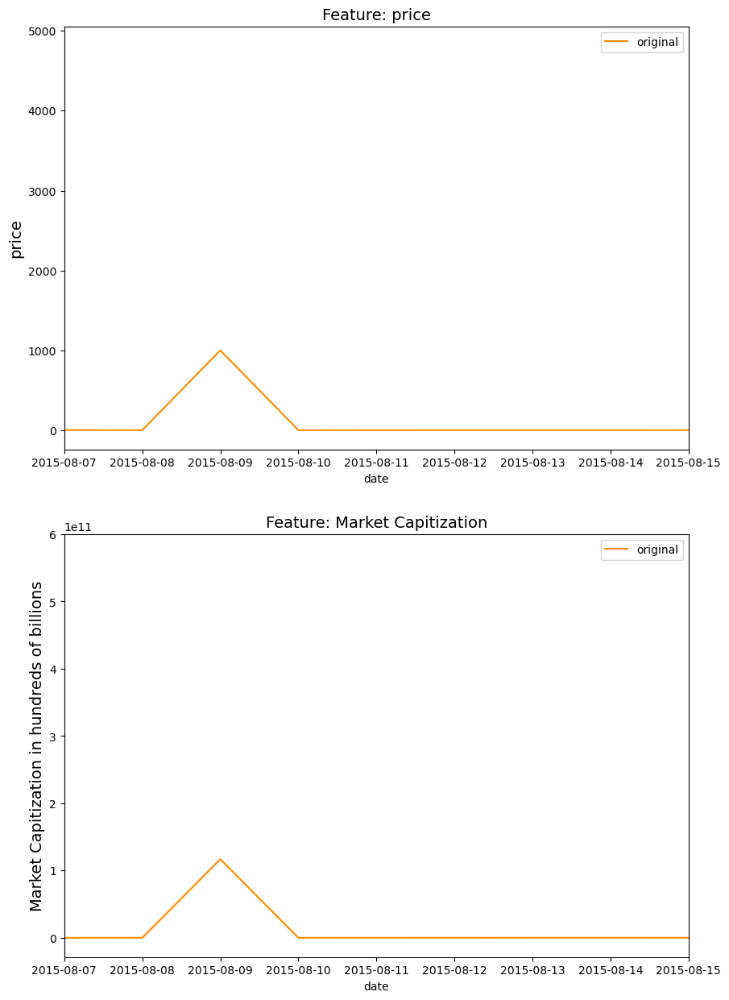

In [27]:
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 15))
sns.lineplot(x=df1.date, y=old_df1_price.fillna(df1['price'].mean()), ax=ax[0], color='darkorange', label = 'original')
ax[0].set_title('Feature: price', fontsize=14)
ax[0].set_ylabel(ylabel='price', fontsize=14)
sns.lineplot(x=df1.date, y=old_df1_market_cap.fillna(df1['market_cap'].mean()), ax=ax[1], color='darkorange', label = 'original')
ax[1].set_title('Feature: Market Capitization', fontsize=14)
ax[1].set_ylabel(ylabel='Market Capitization in hundreds of billions', fontsize=14)
for i in range(2):
     ax[i].set_xlim([date(2015, 8, 7), date(2015, 8, 15)])

plt.show()

In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3183 non-null   float64        
 1   market_cap     3181 non-null   float64        
 2   total_volume   3183 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
dtypes: datetime64[ns](1), float64(3), timedelta64[ns](1)
memory usage: 149.3 KB


In [29]:
df1['market_cap'].mean()

116855459443.93092

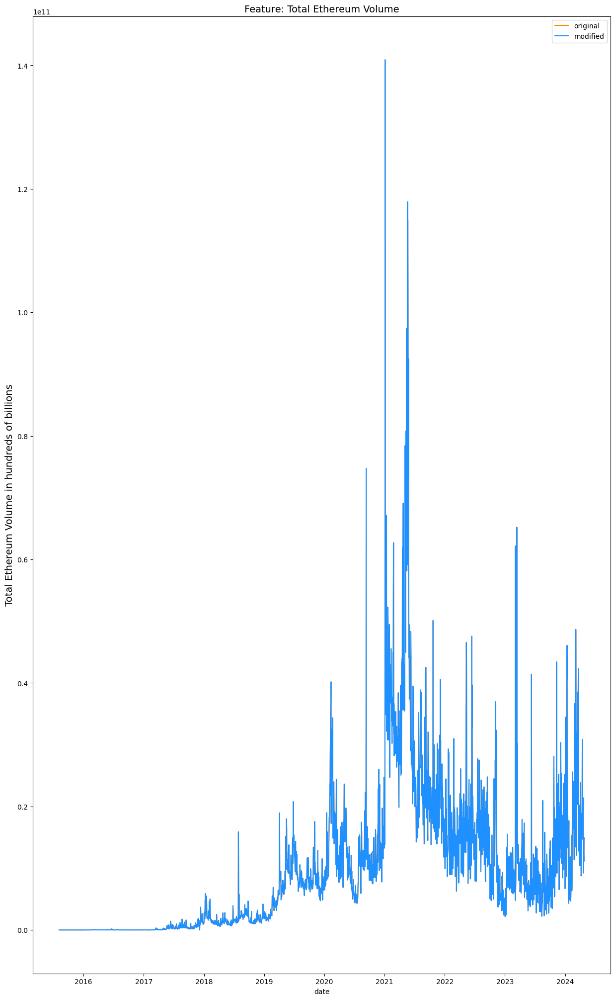

In [30]:
fig = plt.figure(figsize=(15, 25))
old_df1_total_volume = df1.total_volume.copy()
df1['total_volume'] = np.where((df1.total_volume == 0),np.nan, df1.total_volume)

sns.lineplot(x=df1.date, y=old_df1_total_volume.fillna(np.inf), color='darkorange', label = 'original')
sns.lineplot(x=df1.date, y=df1.total_volume.fillna(np.inf), color='dodgerblue', label = 'modified')
plt.title('Feature: Total Ethereum Volume', fontsize=14)
plt.ylabel(ylabel='Total Ethereum Volume in hundreds of billions', fontsize=14)

plt.show()

In [31]:
df2 = df1.drop("time_interval", axis = 1)
df2.head(10)

,price,market_cap,total_volume,date
2015-08-07 00:00:00+00:00,2.831620,NaN,9.062200e+04,2015-08-07
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,2015-08-08
2015-08-09 00:00:00+00:00,NaN,NaN,NaN,2015-08-09
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,2015-08-10
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,2015-08-11
2015-08-12 00:00:00+00:00,1.256613,7.601326e+07,2.073893e+06,2015-08-12
2015-08-13 00:00:00+00:00,1.825395,1.104688e+08,4.380143e+06,2015-08-13
2015-08-14 00:00:00+00:00,1.825975,1.105553e+08,4.355618e+06,2015-08-14
2015-08-15 00:00:00+00:00,1.670950,1.012152e+08,2.519633e+06,2015-08-15
2015-08-16 00:00:00+00:00,1.476607,8.948094e+07,3.032658e+06,2015-08-16


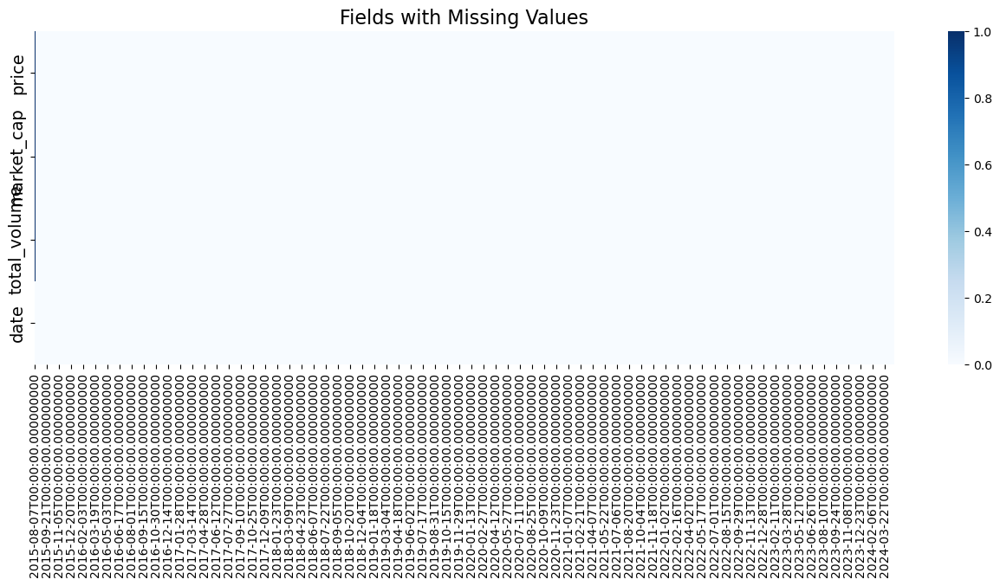

In [32]:
#Getting to see the actual fields with missing data
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,5))
sns.heatmap(df2.T.isna(), cmap='Blues')
ax.set_title('Fields with Missing Values', fontsize=16)
#for tick in ax.xaxis.get_major_ticks():
#    tick.label.set_fontsize(14) 
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(14)
plt.show()

In [33]:
df1.isnull().sum()

price            3
market_cap       5
total_volume     3
time_interval    0
date             0
dtype: int64

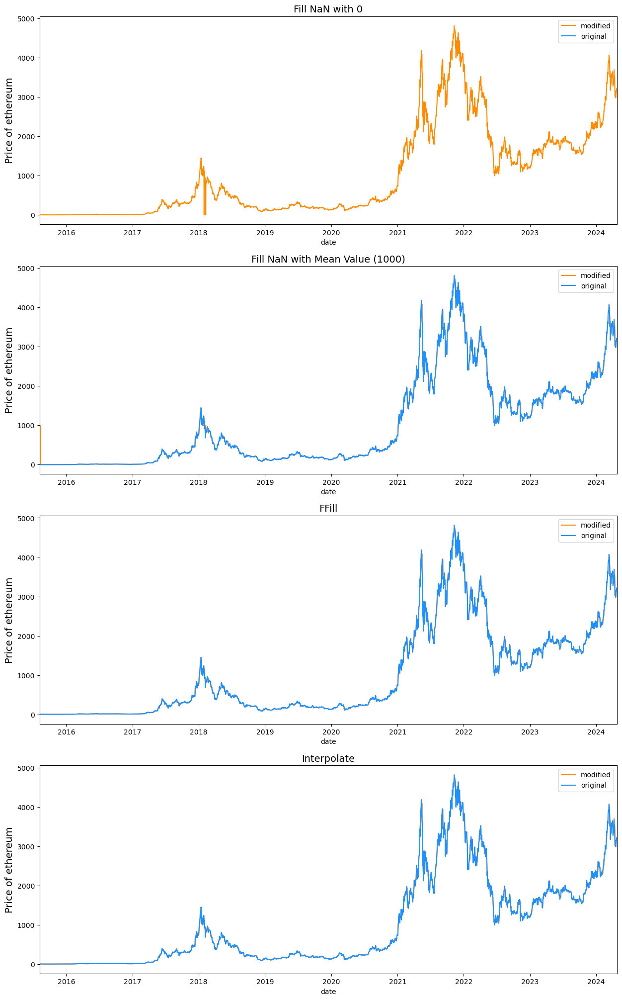

In [34]:
f, ax = plt.subplots(nrows=4, ncols=1, figsize=(15, 25))

sns.lineplot(x=df1.date, y=df1.price.fillna(0), ax=ax[0], color='darkorange', label = 'modified')
sns.lineplot(x=df1.date, y=df.price.fillna(np.inf), ax=ax[0], color='dodgerblue', label = 'original')
ax[0].set_title('Fill NaN with 0', fontsize=14)
ax[0].set_ylabel(ylabel='Price of ethereum', fontsize=14)

mean_val = df1['price'].mean()
sns.lineplot(x=df1.date, y=df1.price.fillna(mean_val), ax=ax[1], color='darkorange', label = 'modified')
sns.lineplot(x=df1.date, y=df1.price.fillna(np.inf), ax=ax[1], color='dodgerblue', label = 'original')
ax[1].set_title(f'Fill NaN with Mean Value ({mean_val:.0f})', fontsize=14)
ax[1].set_ylabel(ylabel='Price of ethereum', fontsize=14)

sns.lineplot(x=df1.date, y=df1.price.ffill(), ax=ax[2], color='darkorange', label = 'modified')
sns.lineplot(x=df1.date, y=df1.price.fillna(np.inf), ax=ax[2], color='dodgerblue', label = 'original')
ax[2].set_title(f'FFill', fontsize=14)
ax[2].set_ylabel(ylabel='Price of ethereum', fontsize=14)

sns.lineplot(x=df1.date, y=df1.price.interpolate(), ax=ax[3], color='darkorange', label = 'modified')
sns.lineplot(x=df1.date, y=df1.price.fillna(np.inf), ax=ax[3], color='dodgerblue', label = 'original')
ax[3].set_title(f'Interpolate', fontsize=14)
ax[3].set_ylabel(ylabel='Price of ethereum', fontsize=14)

for i in range(4):
     ax[i].set_xlim([date(2015,8,7), date(2024,4,26)])
plt.show()

Resampling in time series analysis is an essential technique that involves changing the frequency of the data observations. This process can either involve increasing the frequency (upsampling) or decreasing it (downsampling). The importance of resampling in time series analysis can be attributed to several reasons:

Regularization of Data:
Time series data may be irregular, with observations occurring at different time intervals. Resampling allows you to regularize the data, making it consistent by aligning observations at uniform intervals. This regularization simplifies analysis and modeling processes.

Alignment with Other Data:
When dealing with multiple time series or integrating time series data with other datasets, it's crucial to ensure that the observations are aligned. Resampling allows you to synchronize time series data, facilitating meaningful comparisons and joint analyses.

Feature Engineering:
Resampling is often used in feature engineering to create new features or aggregate existing ones. For example, you might resample daily data to monthly data and calculate statistics (mean, sum, etc.) for each month. This process helps in summarizing trends and patterns at different time granularities.

Modeling Flexibility:
Some time series models may require data to be at a specific frequency. Resampling enables you to adapt your data to meet the requirements of the chosen modeling technique. This can be particularly important when working with machine learning models that have specific input requirements.

Missing Value Handling:
Resampling can also be used to handle missing values in time series data. By filling in or interpolating missing values, you can create a more complete dataset for analysis. The interpolation methods used during resampling depend on the nature of the data and the goals of the analysis.

Noise Reduction:
Resampling can be used to smooth out noisy time series data. Aggregating data over longer time periods (e.g., averaging over hours instead of minutes) can help reduce short-term fluctuations and highlight more prominent trends.

Easier Visualization:
Regularizing the time series data through resampling makes it easier to visualize and interpret. Plots become more readable, and trends are often clearer when the data is presented at a consistent frequency.

In summary, resampling plays a crucial role in preparing time series data for analysis and modeling. It provides flexibility, alignment, and regularization, making the data more suitable for various analytical techniques and ensuring that insights drawn from the analysis are meaningful and accurate.

In [35]:
df1.head(10)

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.831620,NaN,9.062200e+04,1 days,2015-08-07
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08
2015-08-09 00:00:00+00:00,NaN,NaN,NaN,1 days,2015-08-09
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11
2015-08-12 00:00:00+00:00,1.256613,7.601326e+07,2.073893e+06,1 days,2015-08-12
2015-08-13 00:00:00+00:00,1.825395,1.104688e+08,4.380143e+06,1 days,2015-08-13
2015-08-14 00:00:00+00:00,1.825975,1.105553e+08,4.355618e+06,1 days,2015-08-14
2015-08-15 00:00:00+00:00,1.670950,1.012152e+08,2.519633e+06,1 days,2015-08-15
2015-08-16 00:00:00+00:00,1.476607,8.948094e+07,3.032658e+06,1 days,2015-08-16


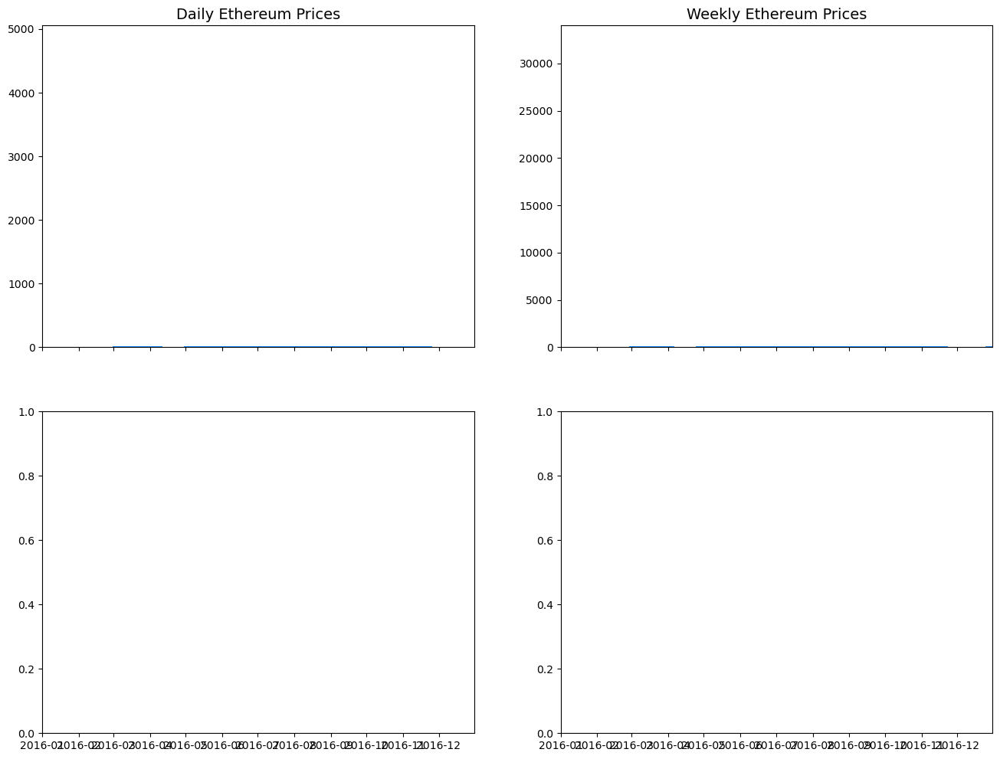

In [36]:
fig, ax = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=(16,12))

ax[0, 0].bar(df1.date, df1.price, width=5, color='dodgerblue')
ax[0, 0].set_title('Daily Ethereum Prices', fontsize=14)

resampled_df = df1[['date','price','market_cap','total_volume']].resample('7D', on='date').sum().reset_index(drop=False)
ax[0, 1].bar(resampled_df.date, resampled_df.price, width=10, color='dodgerblue')
ax[0, 1].set_title('Weekly Ethereum Prices', fontsize=14)


for i in range(2):
    ax[i, 0].set_xlim([date(2016, 1, 1), date(2016, 12, 31)])
    
plt.show()

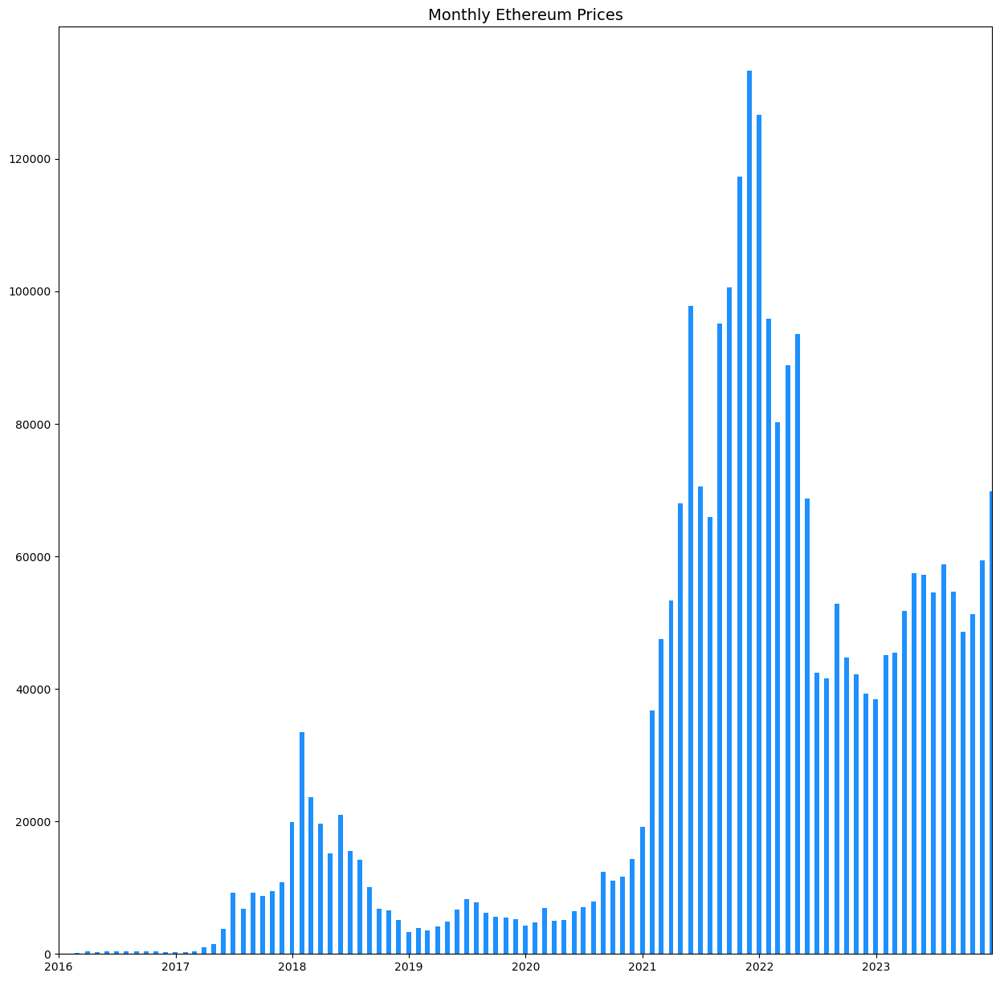

In [37]:
fig = plt.figure(figsize=(15,15))
resampled_df = df1[['date','price','market_cap','total_volume']].resample('M', on='date').sum().reset_index(drop=False)
plt.bar(resampled_df.date, resampled_df.price, width=15, color='dodgerblue')
plt.title('Monthly Ethereum Prices', fontsize=14)

for i in range(1):
     plt.xlim([date(2016, 1, 1), date(2023, 12,31)])

plt.show()




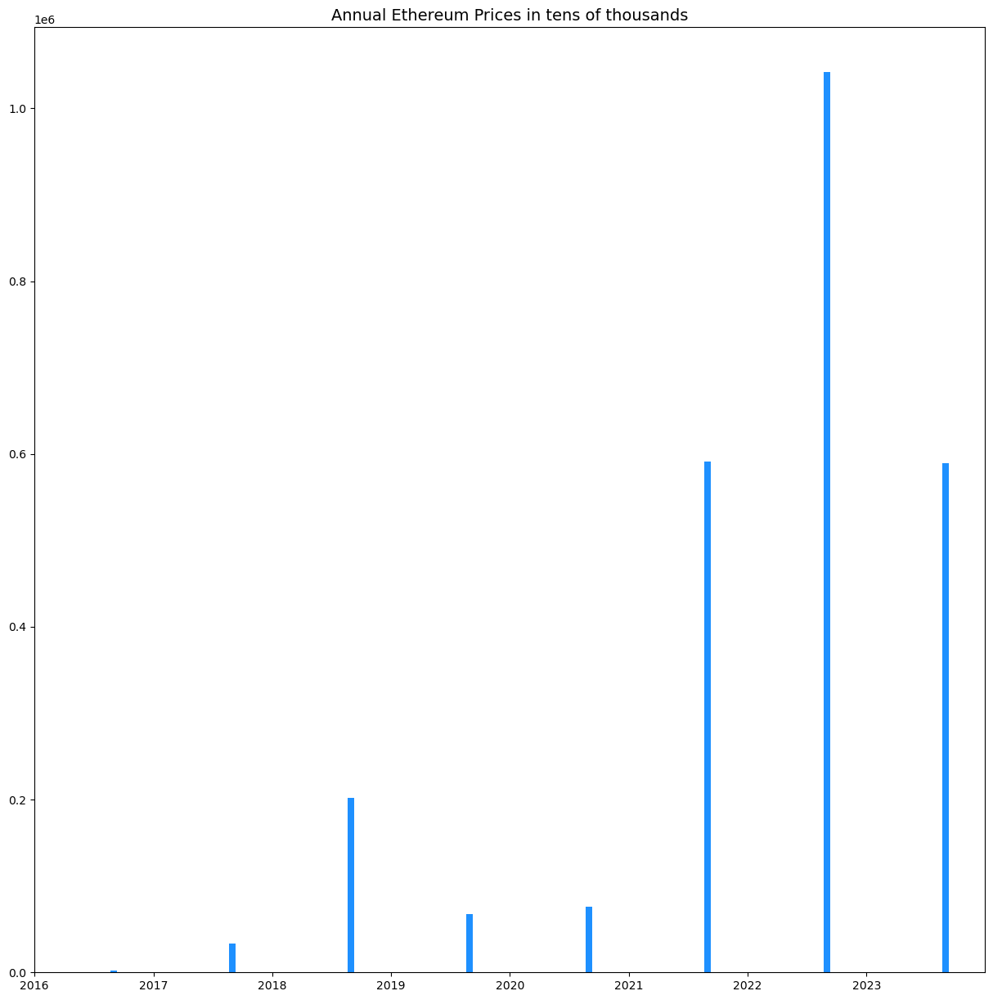

In [38]:
fig = plt.figure(figsize=(15,15))
resampled_df = df1[['date','price','market_cap','total_volume']].resample('12M', on='date').sum().reset_index(drop=False)
plt.bar(resampled_df.date, resampled_df.price, width=20, color='dodgerblue')
plt.title('Annual Ethereum Prices in tens of thousands', fontsize=14)

for i in range(1):
     plt.xlim([date(2016, 1, 1), date(2023, 12,31)])
    
plt.show()

# STATIONARITY

Some time-series models, such as such as ARIMA, assume that the underlying data is stationary. Stationarity describes that the time-series has:

constant mean and mean is not time-dependent
constant variance and variance is not time-dependent
constant covariance and covariance is not time-dependent
If a time series has a specific (stationary) behavior over a given time interval, then it can be assumed that the time series will behave the same at a later time.

Time series with trend and/or seasonality are not stationary. Trend indicates that the mean is not constant over time and seasonality indicates that the variance is not constant over time.

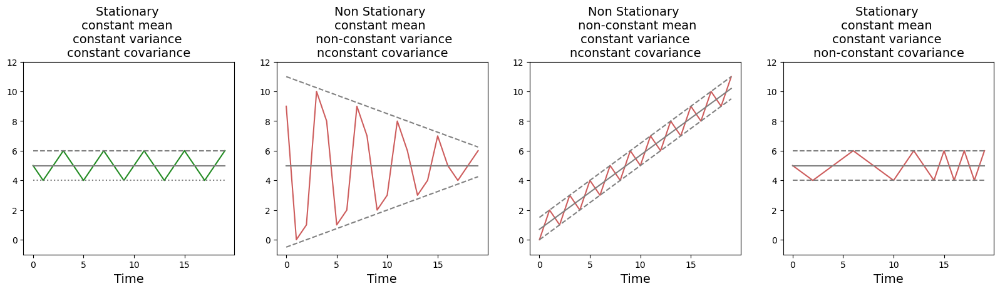

In [39]:
t = np.linspace(0, 19, 20)

fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(20,4))
stationary = [5, 4, 5, 6, 5, 4, 5, 6, 5, 4, 5, 6, 5, 4, 5, 6, 5, 4, 5, 6,]
sns.lineplot(x=t, y=stationary, ax=ax[0], color='forestgreen')
sns.lineplot(x=t, y=5, ax=ax[0], color='grey')
sns.lineplot(x=t, y=6, ax=ax[0], color='grey')
sns.lineplot(x=t, y=4, ax=ax[0], color='grey')
ax[0].lines[2].set_linestyle("--")
ax[0].lines[3].set_linestyle(":")
ax[0].set_title(f'Stationary \nconstant mean \nconstant variance \nconstant covariance', fontsize=14)

nonstationary1 = [ 9, 0, 1, 10, 8, 1, 2, 9, 7, 2, 3, 8, 6, 3, 4, 7, 5, 4, 5, 6]
sns.lineplot(x=t, y=nonstationary1, ax=ax[1], color='indianred' )
sns.lineplot(x=t, y=5, ax=ax[1], color='grey')
sns.lineplot(x=t, y=t*0.25-0.5, ax=ax[1], color='grey')
sns.lineplot(x=t, y=t*(-0.25)+11, ax=ax[1], color='grey')
ax[1].lines[2].set_linestyle("--")
ax[1].lines[3].set_linestyle("--")
ax[1].set_title(f'Non Stationary \nconstant mean \n non-constant variance\nnconstant covariance', fontsize=14)

nonstationary2 = [0, 2, 1, 3, 2, 4, 3, 5, 4, 6, 5, 7, 6, 8, 7, 9, 8, 10, 9, 11,]
sns.lineplot(x=t, y=nonstationary2, ax=ax[2], color='indianred' )
sns.lineplot(x=t, y=t*0.5+0.7, ax=ax[2], color='grey')
sns.lineplot(x=t, y=t*0.5, ax=ax[2], color='grey')
sns.lineplot(x=t, y=t*0.5+1.5, ax=ax[2], color='grey')
ax[2].lines[2].set_linestyle("--")
ax[2].lines[3].set_linestyle("--")
ax[2].set_title(f'Non Stationary \n non-constant mean\nconstant variance\nnconstant covariance', fontsize=14)

nonstationary3 = [5, 4.5, 4, 4.5, 5, 5.5, 6, 5.5, 5, 4.5, 4, 5, 6, 5, 4, 6, 4, 6, 4, 6,]
sns.lineplot(x=t, y=nonstationary3, ax=ax[3], color='indianred')
sns.lineplot(x=t, y=5, ax=ax[3], color='grey')
sns.lineplot(x=t, y=6, ax=ax[3], color='grey')
sns.lineplot(x=t, y=4, ax=ax[3], color='grey')
ax[3].lines[2].set_linestyle("--")
ax[3].lines[3].set_linestyle("--")
ax[3].set_title(f'Stationary \nconstant mean \nconstant variance \nnon-constant covariance', fontsize=14)

for i in range(4):
    ax[i].set_ylim([-1, 12])
    ax[i].set_xlabel('Time', fontsize=14)

In [40]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3183 non-null   float64        
 1   market_cap     3181 non-null   float64        
 2   total_volume   3183 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
dtypes: datetime64[ns](1), float64(3), timedelta64[ns](1)
memory usage: 278.4 KB


### To check for stationarity:

The check for stationarity can be done via three different approaches:

1. visually: plot time series and check for trends or seasonality
2. basic statistics: split time series and compare the mean and variance of each partition
3. statistical test: Augmented Dickey Fuller test

Next, we need to develop a time series model on our data. Since our data is not stationary, that is, has no constant mean and variance across diffrenet resampled timeframes, we have to change it to  stationary data. We are therefore defining timeframes with what we call the rolling windows, set to be either quartely (90 dats), weekly (7 days), yearly(12 months or 52 weeks) depending on the size of your data

In [41]:
df1.head(1)

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.83162,NaN,90622.0,1 days,2015-08-07


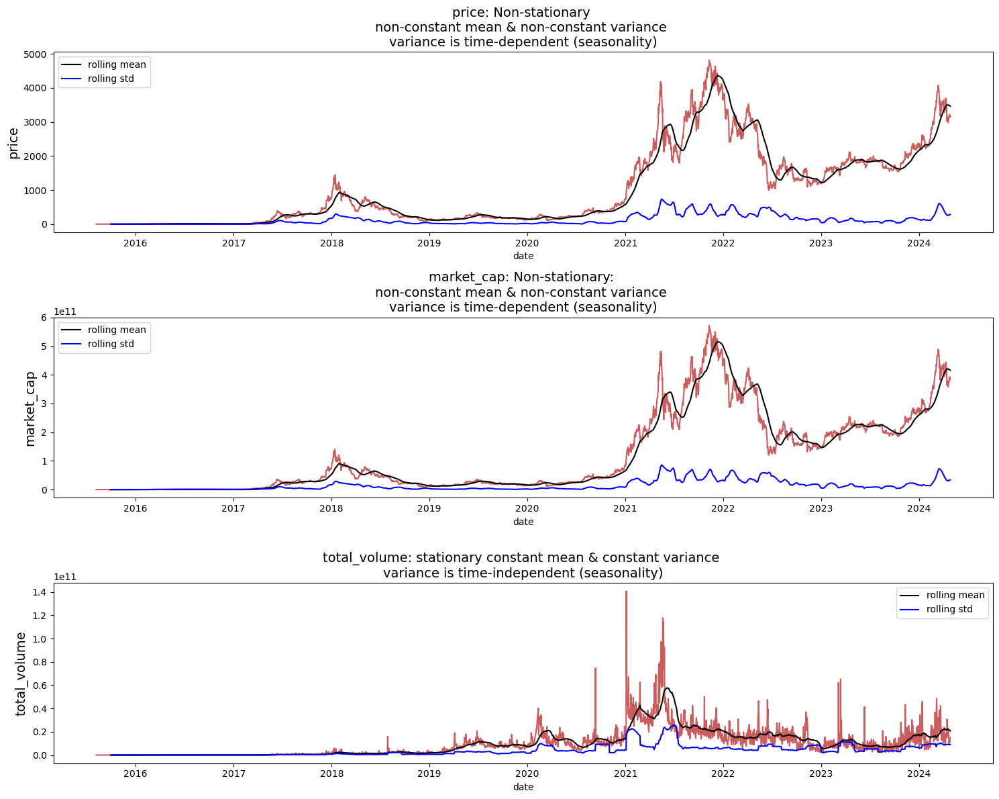

In [42]:
rolling_window = 52
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 12))

sns.lineplot(x=df1.date, y=df1.price, ax=ax[0], color='indianred')
sns.lineplot(x=df1.date, y=df1.price.rolling(rolling_window).mean(), ax=ax[0], color='black', label='rolling mean')
sns.lineplot(x=df1.date, y=df1.price.rolling(rolling_window).std(), ax=ax[0], color='blue', label='rolling std')
ax[0].set_title('price: Non-stationary \nnon-constant mean & non-constant variance \nvariance is time-dependent (seasonality)', fontsize=14)
ax[0].set_ylabel(ylabel='price', fontsize=14)

sns.lineplot(x=df1.date, y=df1.market_cap, ax=ax[1], color='indianred')
sns.lineplot(x=df1.date, y=df1.market_cap.rolling(rolling_window).mean(), ax=ax[1], color='black', label='rolling mean')
sns.lineplot(x=df1.date, y=df1.market_cap.rolling(rolling_window).std(), ax=ax[1], color='blue', label='rolling std')
ax[1].set_title('market_cap: Non-stationary: \nnon-constant mean & non-constant variance \nvariance is time-dependent (seasonality)', fontsize=14)
ax[1].set_ylabel(ylabel='market_cap', fontsize=14)

sns.lineplot(x=df1.date, y=df1.total_volume, ax=ax[2], color='indianred')
sns.lineplot(x=df1.date, y=df1.total_volume.rolling(rolling_window).mean(), ax=ax[2], color='black', label='rolling mean')
sns.lineplot(x=df1.date, y=df1.total_volume.rolling(rolling_window).std(), ax=ax[2], color='blue', label='rolling std')
ax[2].set_title('total_volume: stationary constant mean & constant variance \nvariance is time-independent (seasonality)' , fontsize=14)
ax[2].set_ylabel(ylabel='total_volume', fontsize=14)

# for i in range(3):
#     ax[i].set_xlim([date(2009, 1, 1), date(2020, 6, 30)])


plt.tight_layout()
plt.show()

In [43]:
df1.head(1)

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.83162,NaN,90622.0,1 days,2015-08-07


In [44]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3183 non-null   float64        
 1   market_cap     3181 non-null   float64        
 2   total_volume   3183 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
dtypes: datetime64[ns](1), float64(3), timedelta64[ns](1)
memory usage: 278.4 KB


In [45]:
num_partitions = 2
partition_length = int(len(df1) / num_partitions)

numeric_column_name = ['price','market_cap','total_volume']  # Replace with the actual name of your numeric column
numeric_column = df1[numeric_column_name]

# Calculate mean and variance for the first partition
partition1_mean = numeric_column.head(partition_length).mean()
partition1_var = numeric_column.head(partition_length).var()


# Calculate mean and variance for the second partition
partition2_mean = numeric_column.tail(partition_length).mean()
partition2_var = numeric_column.tail(partition_length).var()

# Add the 'Date' column back to the DataFrame if needed
result_df = pd.DataFrame({
    'Partition Mean 1': [partition1_mean],
    'Partition Variance 1': [partition1_var],
    'Partition Mean 2': [partition2_mean],
    'Partition Variance 2': [partition2_var]
})

# Display or use the result_df as needed
result_df.head()

,Partition Mean 1,Partition Variance 1,Partition Mean 2,Partition Variance 2
0,price 2.039271e+02 market_cap 2...,price 5.950404e+04 market_cap 5...,price 1.794824e+03 market_cap 2...,price 1.290618e+06 market_cap 1...


In [46]:
partition1_mean

price           2.039271e+02
market_cap      2.027972e+10
total_volume    2.160225e+09
dtype: float64

In [47]:
stationarity_test = pd.concat([partition1_mean, partition2_mean, partition1_var, partition2_var], axis=1)
stationarity_test.columns = ['Partition 1 Mean', 'Partition 2 Mean', 'Partition 1 Variance', 'Partition 2 Variance']

def highlight_greater(x):
    temporary_x = x.copy()
    temporary_x = temporary_x.round(0).astype(int)
    m1 = (temporary_x['Partition 1 Mean'] == temporary_x['Partition 2 Mean'])
    m2 = (temporary_x['Partition 1 Variance'] == temporary_x['Partition 2 Variance'])
    m3 = (temporary_x['Partition 1 Mean'] < temporary_x['Partition 2 Mean']+3) & (temporary_x['Partition 1 Mean'] > temporary_x['Partition 2 Mean']-3)
    m4 = (temporary_x['Partition 1 Variance'] < temporary_x['Partition 2 Variance']+3) & (temporary_x['Partition 1 Variance'] > temporary_x['Partition 2 Variance']-3)

    df2 = pd.DataFrame('background-color: ', index=x.index, columns=x.columns)
    #rewrite values by boolean masks
    df2['Partition 1 Mean'] = np.where(~m1, 'background-color: {}'.format('salmon'), df2['Partition 1 Mean'])
    df2['Partition 2 Mean'] = np.where(~m1, 'background-color: {}'.format('salmon'), df2['Partition 2 Mean'])
    df2['Partition 1 Mean'] = np.where(m3, 'background-color: {}'.format('gold'), df2['Partition 1 Mean'])
    df2['Partition 2 Mean'] = np.where(m3, 'background-color: {}'.format('gold'), df2['Partition 2 Mean'])
    df2['Partition 1 Mean'] = np.where(m1, 'background-color: {}'.format('mediumseagreen'), df2['Partition 1 Mean'])
    df2['Partition 2 Mean'] = np.where(m1, 'background-color: {}'.format('mediumseagreen'), df2['Partition 2 Mean'])

    df2['Partition 1 Variance'] = np.where(~m2, 'background-color: {}'.format('salmon'), df2['Partition 1 Variance'])
    df2['Partition 2 Variance'] = np.where(~m2, 'background-color: {}'.format('salmon'), df2['Partition 2 Variance'])
    df2['Partition 1 Variance'] = np.where(m4, 'background-color: {}'.format('gold'), df2['Partition 1 Variance'])
    df2['Partition 2 Variance'] = np.where(m4, 'background-color: {}'.format('gold'), df2['Partition 2 Variance'])
    df2['Partition 1 Variance'] = np.where(m2, 'background-color: {}'.format('mediumseagreen'), df2['Partition 1 Variance'])
    df2['Partition 2 Variance'] = np.where(m2, 'background-color: {}'.format('mediumseagreen'), df2['Partition 2 Variance'])

    return df2


stationarity_test.style.apply(highlight_greater, axis=None).format("{:20,.0f}")

,Partition 1 Mean,Partition 2 Mean,Partition 1 Variance,Partition 2 Variance
price,204,"1,795","59,504","1,290,618"
market_cap,"20,279,724,876","213,128,068,668","571,049,115,209,831,874,560","18,330,225,681,092,325,670,912"
total_volume,"2,160,225,327","17,437,730,013","11,416,009,100,389,525,504","170,596,342,385,458,413,568"


Let's evaluate the histograms. Since we are looking at the mean and variance, we are expecting that the data conforms to a Gaussian distribution (bell shaped distribution) in case of stationarity.

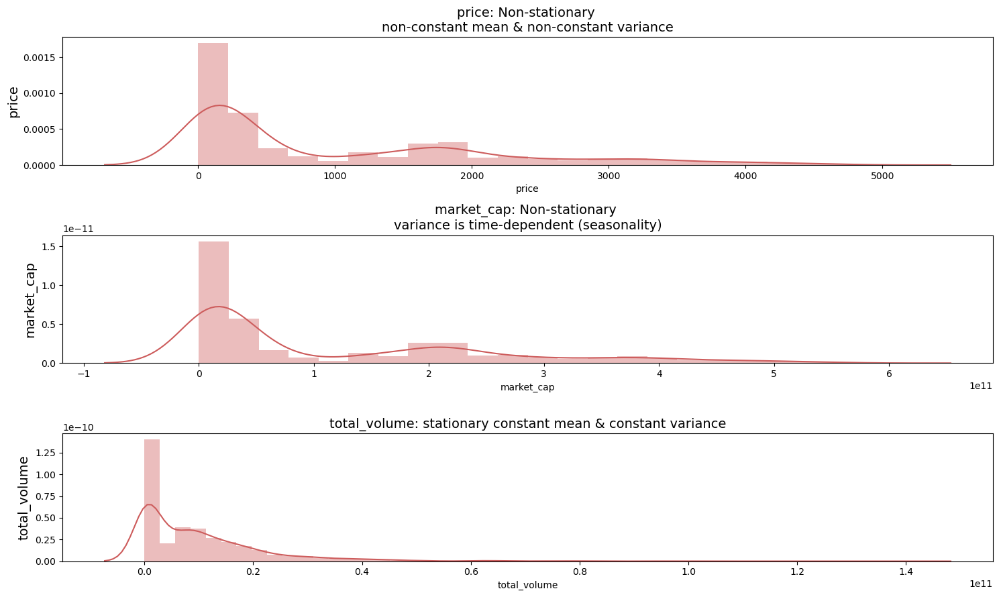

In [48]:
import warnings as ws
ws.filterwarnings('ignore')
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 9))

price_mean = df1['price'].mean()
sns.distplot(df1.price.fillna(price_mean), ax=ax[0], color='indianred')
ax[0].set_title('price: Non-stationary \nnon-constant mean & non-constant variance', fontsize=14)
ax[0].set_ylabel(ylabel='price', fontsize=14)

market_cap_median = df1['market_cap'].median()
sns.distplot(df1.market_cap.fillna(market_cap_median), ax=ax[1], color='indianred')
ax[1].set_title('market_cap: Non-stationary \nvariance is time-dependent (seasonality)', fontsize=14)
ax[1].set_ylabel(ylabel='market_cap', fontsize=14)

sns.distplot(df1.total_volume.fillna(0), ax=ax[2], color='indianred')
ax[2].set_title('total_volume: stationary constant mean & constant variance', fontsize=14)
ax[2].set_ylabel(ylabel='total_volume', fontsize=14)


plt.tight_layout()
plt.show()

Augmented Dickey-Fuller (ADF) test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

Null Hypothesis (H0):Time series is NOT stationary(Time series has a unit root.).

Alternate Hypothesis (H1):Time series is stationary(Time series has no unit root).

If the null hypothesis can be rejected, we can conclude that the time series is stationary.

There are two ways to rejects the null hypothesis:

On the one hand, the null hypothesis can be rejected if the p-value is below a set significance level. The defaults significance level is 5%

**p-value > significance level (default: 0.05)**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**p-value <= significance level (default: 0.05)**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.
On the other hand, the null hypothesis can be rejects if the test statistic is less than the critical value.

**ADF statistic > critical value**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**ADF statistic < critical value**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

In [49]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df.price.values)
print(result)
adf_stat = result[0]
p_val = result[1]
crit_val_1 = result[4]['1%']
crit_val_5 = result[4]['5%']
crit_val_10 = result[4]['10%']

(-1.4546599584031012, 0.5558094375751367, 28, 3156, {'1%': -3.4324237093576846, '5%': -2.862456237513167, '10%': -2.5672577344900813}, 35313.86566078833)


In [50]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3183 non-null   float64        
 1   market_cap     3181 non-null   float64        
 2   total_volume   3183 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
dtypes: datetime64[ns](1), float64(3), timedelta64[ns](1)
memory usage: 278.4 KB


Comparing p-value of 0.5558094 with the alpha value of default 0.05; p value > alpha value. Therefore, we Fail to reject the null hypothesis (H0), and conclude that the price has a unit root and is non-stationary.

In [51]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df1.market_cap.fillna(df1['market_cap'].mean()).values)
print(result)
adf_stat = result[0]
p_val = result[1]
crit_val_1 = result[4]['1%']
crit_val_5 = result[4]['5%']
crit_val_10 = result[4]['10%']

(-1.3303303017900647, 0.6151844903863738, 28, 3157, {'1%': -3.4324230519616883, '5%': -2.862455947153645, '10%': -2.5672575799077504}, 152982.18493873306)


Comparing p-value of 0.6151 with the alpha value of default 0.05; p value > alpha value. Therefore, we Fail to reject the null hypothesis (H0), and conclude that the Market Capitization has a unit root and is non-stationary.

In [52]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df1.total_volume.fillna(df1['total_volume'].mean()).values)
print(result)
adf_stat = result[0]
p_val = result[1]
crit_val_1 = result[4]['1%']
crit_val_5 = result[4]['5%']
crit_val_10 = result[4]['10%']

(-3.1481184251280685, 0.023191145861563775, 27, 3158, {'1%': -3.4324223949823685, '5%': -2.8624556569780975, '10%': -2.5672574254233744}, 149824.10822430602)


Comparing p-value of 0.02319 with the alpha value of default 0.05; p value < alpha value. Therefore, we are to reject the null hypothesis (H0), and conclude that the total volume has no root and is stationary.

In [53]:
df1  = df1.fillna(df1.mean())

In [54]:
df1.head()

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.831620,1.168555e+11,9.062200e+04,1 days,2015-08-07
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08
2015-08-09 00:00:00+00:00,1000.125105,1.168555e+11,9.806177e+09,1 days,2015-08-09
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11


In [55]:
df1.head(1)

,price,market_cap,total_volume,time_interval,date
2015-08-07 00:00:00+00:00,2.83162,1.168555e+11,90622.0,1 days,2015-08-07


In [56]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3186 non-null   float64        
 1   market_cap     3186 non-null   float64        
 2   total_volume   3186 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
dtypes: datetime64[ns](1), float64(3), timedelta64[ns](1)
memory usage: 278.4 KB


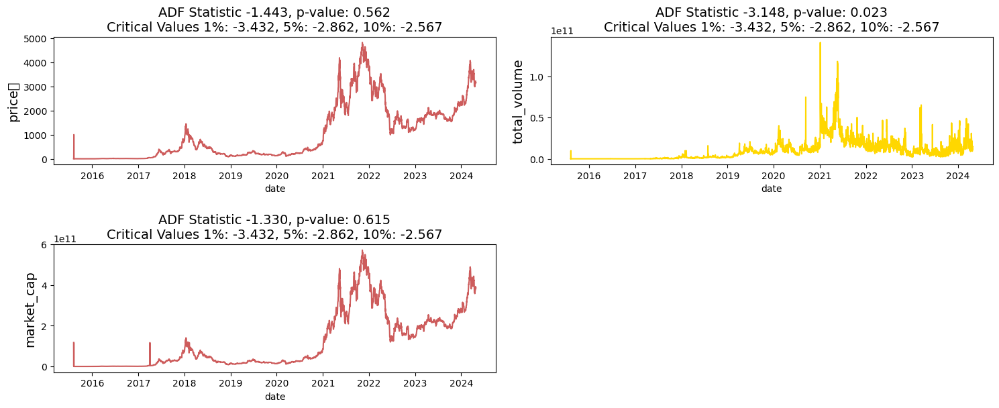

In [57]:
df1['price'] = pd.to_numeric(df1['price'])
df1['market_cap'] = pd.to_numeric(df1['market_cap'])
df1['total_volume'] = pd.to_numeric(df1['total_volume'])
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(15, 9))

def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'skyblue' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'
    sns.lineplot(x=df1.date, y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

    
columns_to_fill = ['price', 'market_cap', 'total_volume', 'price', 'market_cap']

# for column in columns_to_fill:
#     df1[column] = df1[column].fillna(df1[column].mean())

visualize_adfuller_results(df1['price'], 'price	', ax[0, 0])
visualize_adfuller_results(df1['market_cap'], 'market_cap', ax[1, 0])
visualize_adfuller_results(df1['total_volume'], 'total_volume', ax[0, 1])

f.delaxes(ax[2, 1])
f.delaxes(ax[2, 0])
f.delaxes(ax[1, 1])
plt.tight_layout()
plt.show()


If the data is not stationary to begin with, we should rethink of the choice of model.

The two most common methods to achieve stationarity are:

1. **Transformation:** e.g. log or square root to stabilize non-constant variance
2. **Differencing:** subtracts the current value from the previous


Differencing can be done in different orders:

First order differencing: linear trends with  zi=yi−yi−1
 
Second-order differencing: quadratic trends with  zi=(yi−yi−1)−(yi−1−yi−2)
 
and so on...


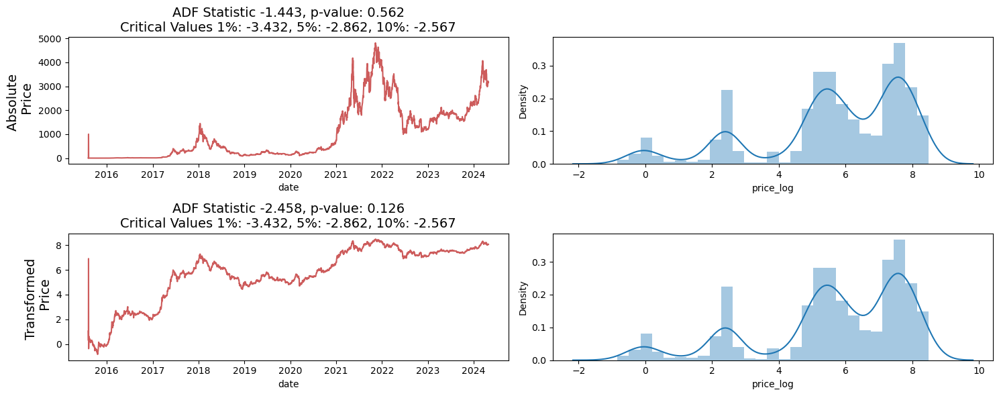

In [58]:
# Log Transform of absolute values
# # (Log transoform of negative values will return NaN)
df1['price_log'] = np.log(abs(df1.price))


f, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 6))
visualize_adfuller_results(abs(df1.price), 'Absolute \n Price', ax[0, 0])

sns.distplot(df1.price_log, ax=ax[0, 1])
visualize_adfuller_results(df1.price_log, 'Transformed \n Price', ax[1, 0])

sns.distplot(df1.price_log, ax=ax[1, 1])

plt.tight_layout()
plt.show()

In [59]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2015-08-07 00:00:00+00:00 to 2024-04-26 00:00:00+00:00
Freq: D
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype          
---  ------         --------------  -----          
 0   price          3186 non-null   float64        
 1   market_cap     3186 non-null   float64        
 2   total_volume   3186 non-null   float64        
 3   time_interval  3186 non-null   timedelta64[ns]
 4   date           3186 non-null   datetime64[ns] 
 5   price_log      3186 non-null   float64        
dtypes: datetime64[ns](1), float64(4), timedelta64[ns](1)
memory usage: 303.3 KB


In [60]:
df1.head()

,price,market_cap,total_volume,time_interval,date,price_log
2015-08-07 00:00:00+00:00,2.831620,1.168555e+11,9.062200e+04,1 days,2015-08-07,1.040849
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08,0.285743
2015-08-09 00:00:00+00:00,1000.125105,1.168555e+11,9.806177e+09,1 days,2015-08-09,6.907880
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10,-0.374569
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11,0.065206


In [61]:
df1['price'].head(3)

2015-08-07 00:00:00+00:00       2.831620
2015-08-08 00:00:00+00:00       1.330750
2015-08-09 00:00:00+00:00    1000.125105
Freq: D, Name: price, dtype: float64

In [62]:
df1.shape

(3186, 6)

In [63]:
df1.head(10)

,price,market_cap,total_volume,time_interval,date,price_log
2015-08-07 00:00:00+00:00,2.831620,1.168555e+11,9.062200e+04,1 days,2015-08-07,1.040849
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08,0.285743
2015-08-09 00:00:00+00:00,1000.125105,1.168555e+11,9.806177e+09,1 days,2015-08-09,6.907880
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10,-0.374569
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11,0.065206
2015-08-12 00:00:00+00:00,1.256613,7.601326e+07,2.073893e+06,1 days,2015-08-12,0.228420
2015-08-13 00:00:00+00:00,1.825395,1.104688e+08,4.380143e+06,1 days,2015-08-13,0.601797
2015-08-14 00:00:00+00:00,1.825975,1.105553e+08,4.355618e+06,1 days,2015-08-14,0.602114
2015-08-15 00:00:00+00:00,1.670950,1.012152e+08,2.519633e+06,1 days,2015-08-15,0.513392
2015-08-16 00:00:00+00:00,1.476607,8.948094e+07,3.032658e+06,1 days,2015-08-16,0.389747


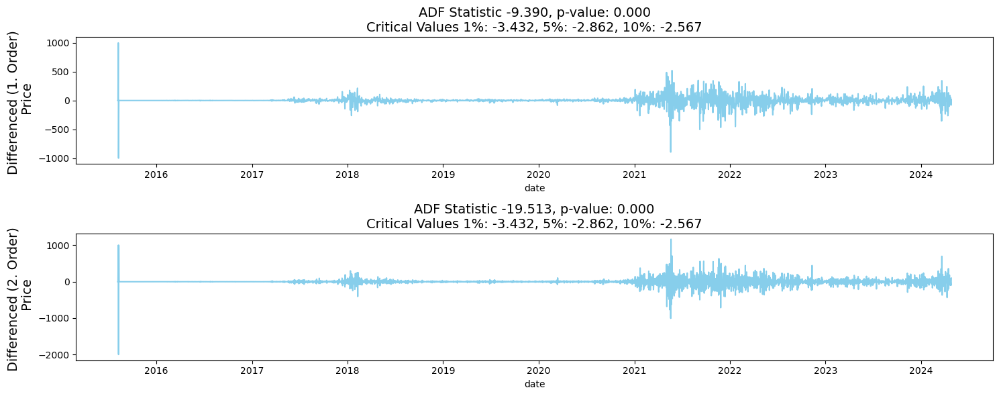

False

In [64]:
# #For differencing
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 6))
new_index = df1.index[1:]  # Index starting from the second element
df1['price_diff_1'] = pd.Series(np.diff(df1['price'], n=1), index=new_index)
yet_new_index = df1.index[2:]
df1['price_diff_2'] = pd.Series(np.diff(df1['price'], n=2), index=yet_new_index)
visualize_adfuller_results(df1.price_diff_1.fillna(df1['price_diff_1'].mean()), 'Differenced (1. Order) \n Price', ax[0])
visualize_adfuller_results(df1.price_diff_2.fillna(df1['price_diff_2'].mean()), 'Differenced (2. Order) \n Price', ax[1])


plt.tight_layout()
plt.show()



# #The differencing can be reverted if the the first value before differencing is known. In this case, we can accumulate all values with the f#unction .cumsum() and add the first value of the original time series.



df1.price.equals(df1.price_diff_1.cumsum() + df1.price.iloc[0])

In [65]:
df1.head()

,price,market_cap,total_volume,time_interval,date,price_log,price_diff_1,price_diff_2
2015-08-07 00:00:00+00:00,2.831620,1.168555e+11,9.062200e+04,1 days,2015-08-07,1.040849,NaN,NaN
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08,0.285743,-1.500870,NaN
2015-08-09 00:00:00+00:00,1000.125105,1.168555e+11,9.806177e+09,1 days,2015-08-09,6.907880,998.794355,1000.295225
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10,-0.374569,-999.437519,-1998.231874
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11,0.065206,0.379793,999.817313


In [66]:
df1['price_diff_2'].shape

(3186,)

In [67]:
df1['year'] = pd.DatetimeIndex(df1['date']).year
df1['month'] = pd.DatetimeIndex(df1['date']).month
df1['day'] = pd.DatetimeIndex(df1['date']).day
df1['day_of_year'] = pd.DatetimeIndex(df1['date']).dayofyear
#df1['week_of_year'] = df1.months/
df1['quarter'] = pd.DatetimeIndex(df1['date']).quarter
df1['season'] = df1.month%12 // 3 + 1

df1[['price','date', 'year', 'month', 'day', 'day_of_year', 'quarter', 'season']].tail(10)

,price,date,year,month,day,day_of_year,quarter,season
2024-04-17 00:00:00+00:00,3083.706015,2024-04-17,2024,4,17,108,2,2
2024-04-18 00:00:00+00:00,2982.615735,2024-04-18,2024,4,18,109,2,2
2024-04-19 00:00:00+00:00,3064.911592,2024-04-19,2024,4,19,110,2,2
2024-04-20 00:00:00+00:00,3065.682562,2024-04-20,2024,4,20,111,2,2
2024-04-21 00:00:00+00:00,3152.191507,2024-04-21,2024,4,21,112,2,2
2024-04-22 00:00:00+00:00,3147.137754,2024-04-22,2024,4,22,113,2,2
2024-04-23 00:00:00+00:00,3199.769590,2024-04-23,2024,4,23,114,2,2
2024-04-24 00:00:00+00:00,3218.967269,2024-04-24,2024,4,24,115,2,2
2024-04-25 00:00:00+00:00,3138.814357,2024-04-25,2024,4,25,116,2,2
2024-04-26 00:00:00+00:00,3157.619317,2024-04-26,2024,4,26,117,2,2


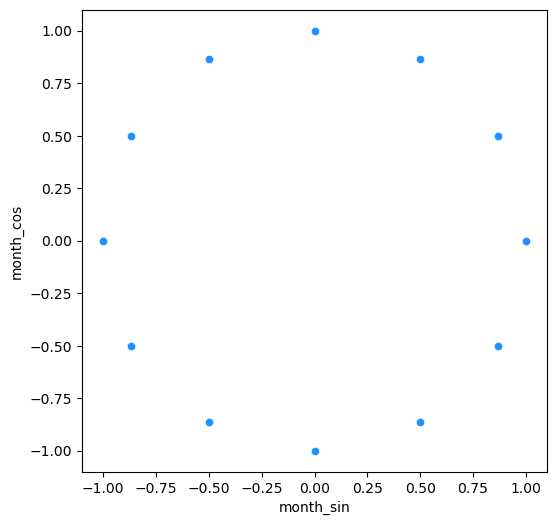

In [68]:
days_in_month = 30
df1['day_sin'] = np.sin(2*np.pi*df1.day/days_in_month)
df1['day_cos'] = np.cos(2*np.pi*df1.day/days_in_month)

months_in_year = 12
df1['month_sin'] = np.sin(2*np.pi*df1.month/months_in_year)
df1['month_cos'] = np.cos(2*np.pi*df1.month/months_in_year)

days_in_year = 365
df1['day_of_year_sin'] = np.sin(2*np.pi*df1.day_of_year/days_in_year)
df1['day_of_year_cos'] = np.cos(2*np.pi*df1.day_of_year/days_in_year)

# weeks_in_year = 52.1429
# df1['week_of_year_sin'] = np.sin(2*np.pi*df1.week_of_year/weeks_in_year)
# df1['week_of_year_cos'] = np.cos(2*np.pi*df1.week_of_year/weeks_in_year)

quarters_in_year = 4
df1['quarter_sin'] = np.sin(2*np.pi*df1.quarter/quarters_in_year)
df1['quarter_cos'] = np.cos(2*np.pi*df1.quarter/quarters_in_year)

seasons_in_year = 4
df1['season_sin'] = np.sin(2*np.pi*df1.season/seasons_in_year)
df1['season_cos'] = np.cos(2*np.pi*df1.season/seasons_in_year)

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))

sns.scatterplot(x=df1.month_sin, y=df1.month_cos, color='dodgerblue')
plt.show()

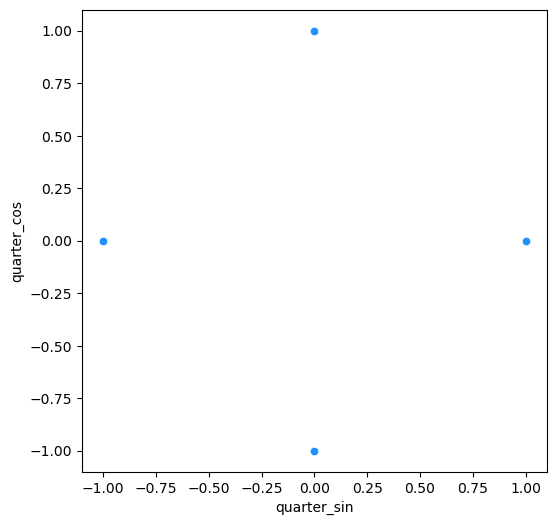

In [69]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
sns.scatterplot(x=df1.quarter_sin, y=df1.quarter_cos, color='dodgerblue')
plt.show()

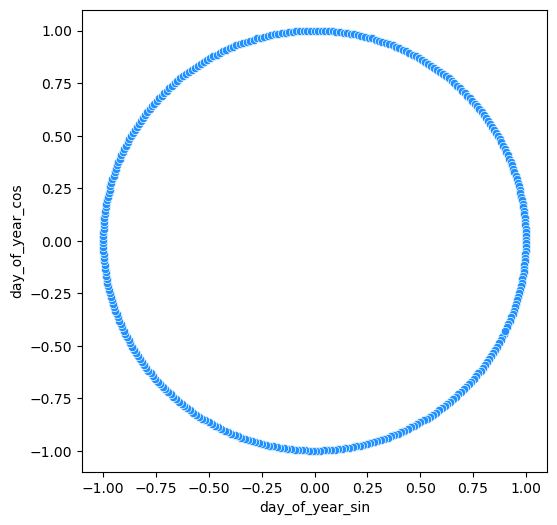

In [70]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
sns.scatterplot(x=df1.day_of_year_sin, y=df1.day_of_year_cos, color='dodgerblue')
plt.show()

Since the plot of Cosine transformation of month against Sine transformation of month yields a 360 degree turn, we can conclude that our tranformative model has worked well in ensuring that we have a full transition from one month to the other, even between December of the current year in observation and January of tghe follwing year

**Decomposition**


The characteristics of a time series are

1. Trend and Level
2. Seasonality
3. Random / Noise
4. We can use the function seasonal_decompose() from the statsmodels library.

**Additive:  y(t)=Level+Trend+Seasonality+Noise**
 
**Multiplicative:  y(t)=Level∗Trend∗Seasonality∗Noise**

**Additive Model:**

**When the trend and seasonality components are relatively constant across time:** Use an additive model when the variations in the time series are consistent over time, and the amplitude of the seasonality does not depend on the level of the time series.
**Linear relationships:** An additive model assumes that the components are added together, which is suitable when the contribution of each component is consistent regardless of the level of the time series.
Mathematically:


**Y(t)=Level+Trend+Seasonality+Noise**

**Multiplicative Model:**

When the trend and seasonality components vary with the level of the time series: Use a multiplicative model when the amplitude of seasonality or the impact of the trend increases or decreases with the level of the time series.
Non-linear relationships: A multiplicative model assumes that the components are multiplied together, which is appropriate when the interaction between the components is non-linear.
Mathematically:

**Y(t)=Level×Trend×Seasonality×Noise**

In practice, the choice between additive and multiplicative models often involves visual inspection of the time series data. If the amplitude of seasonality and the impact of the trend seem to increase with the level of the time series, a multiplicative model might be more appropriate. If the variations appear to be more consistent, an additive model may be suitable.

In [71]:
df1.head(1)

,price,market_cap,total_volume,time_interval,date,price_log,price_diff_1,price_diff_2,year,month,...,day_sin,day_cos,month_sin,month_cos,day_of_year_sin,day_of_year_cos,quarter_sin,quarter_cos,season_sin,season_cos
2015-08-07 00:00:00+00:00,2.83162,1.168555e+11,90622.0,1 days,2015-08-07,1.040849,NaN,NaN,2015,8,...,0.994522,0.104528,-0.866025,-0.5,-0.587785,-0.809017,-1.0,-1.836970e-16,-1.0,-1.836970e-16


In [72]:
from statsmodels.tsa.seasonal import seasonal_decompose

decompose_cols =  ['price', 'market_cap', 
                   'total_volume']

for col in decompose_cols:
    decomp = seasonal_decompose(df1[col], period=52, model='additive', extrapolate_trend='freq')
    df1[f"{col}_trend"] = decomp.trend
    df1[f"{col}_seasonal"] = decomp.seasonal
df1.head()

,price,market_cap,total_volume,time_interval,date,price_log,price_diff_1,price_diff_2,year,month,...,quarter_sin,quarter_cos,season_sin,season_cos,price_trend,price_seasonal,market_cap_trend,market_cap_seasonal,total_volume_trend,total_volume_seasonal
2015-08-07 00:00:00+00:00,2.831620,1.168555e+11,9.062200e+04,1 days,2015-08-07,1.040849,NaN,NaN,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.463784,2.878762,9.590693e+08,2.013287e+09,6.116805e+07,3.105178e+07
2015-08-08 00:00:00+00:00,1.330750,8.033948e+07,3.680700e+05,1 days,2015-08-08,0.285743,-1.500870,NaN,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.353663,4.107848,9.441945e+08,3.811042e+08,6.017033e+07,2.358888e+09
2015-08-09 00:00:00+00:00,1000.125105,1.168555e+11,9.806177e+09,1 days,2015-08-09,6.907880,998.794355,1000.295225,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.243542,16.246108,9.293197e+08,1.572954e+09,5.917261e+07,1.262364e+09
2015-08-10 00:00:00+00:00,0.687586,4.155631e+07,4.004641e+05,1 days,2015-08-10,-0.374569,-999.437519,-1998.231874,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.133421,-0.534086,9.144449e+08,-3.520145e+08,5.817488e+07,-2.180912e+08
2015-08-11 00:00:00+00:00,1.067379,6.453901e+07,1.518998e+06,1 days,2015-08-11,0.065206,0.379793,999.817313,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.023300,-4.484252,8.995700e+08,-9.320791e+08,5.717716e+07,-6.711420e+08


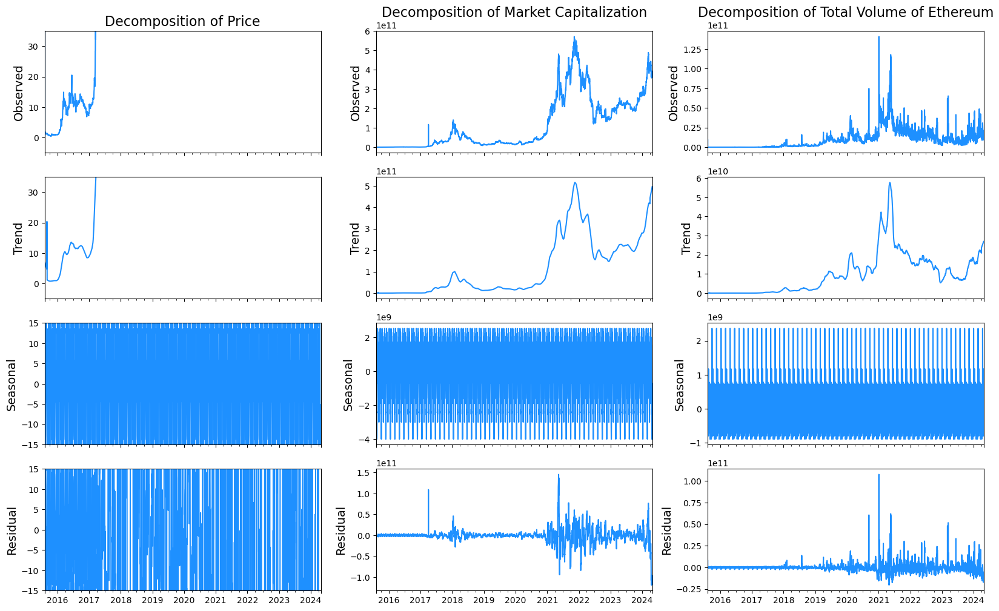

In [73]:
fig, ax = plt.subplots(ncols=3, nrows=4, sharex=True, figsize=(20,12))
res = seasonal_decompose(df1.price, period=52, model='additive', extrapolate_trend='freq')

ax[0,0].set_title('Decomposition of Price', fontsize=16)
res.observed.plot(ax=ax[0,0], legend=False, color='dodgerblue')
ax[0,0].set_ylabel('Observed', fontsize=14)
ax[0,0].set_ylim([-5, 35])

res.trend.plot(ax=ax[1,0], legend=False, color='dodgerblue')
ax[1,0].set_ylabel('Trend', fontsize=14)
ax[1,0].set_ylim([-5, 35])

res.seasonal.plot(ax=ax[2,0], legend=False, color='dodgerblue')
ax[2,0].set_ylabel('Seasonal', fontsize=14)
ax[2,0].set_ylim([-15, 15])

res.resid.plot(ax=ax[3,0], legend=False, color='dodgerblue')
ax[3,0].set_ylabel('Residual', fontsize=14)
ax[3,0].set_ylim([-15, 15])

ax[0,1].set_title('Decomposition of Market Capitalization', fontsize=16)
res = seasonal_decompose(df1.market_cap, period=52, model='additive', extrapolate_trend='freq')

res.observed.plot(ax=ax[0, 1], legend=False, color='dodgerblue')
ax[0, 1].set_ylabel('Observed', fontsize=14)

res.trend.plot(ax=ax[1, 1], legend=False, color='dodgerblue')
ax[1, 1].set_ylabel('Trend', fontsize=14)

res.seasonal.plot(ax=ax[2, 1], legend=False, color='dodgerblue')
ax[2, 1].set_ylabel('Seasonal', fontsize=14)

res.resid.plot(ax=ax[3, 1], legend=False, color='dodgerblue')
ax[3, 1].set_ylabel('Residual', fontsize=14)

ax[0,2].set_title('Decomposition of Total Volume of Ethereum', fontsize=16)
res = seasonal_decompose(df1.total_volume, period=52, model='additive', extrapolate_trend='freq')
res.observed.plot(ax=ax[0,2], legend=False, color='dodgerblue')
ax[0, 2].set_ylabel('Observed', fontsize=14)

res.trend.plot(ax=ax[1,2], legend=False, color='dodgerblue')
ax[1, 2].set_ylabel('Trend', fontsize=14)

res.seasonal.plot(ax=ax[2,2], legend=False, color='dodgerblue')
ax[2, 2].set_ylabel('Seasonal', fontsize=14)

res.resid.plot(ax=ax[3, 2], legend=False, color='dodgerblue')
ax[3, 2].set_ylabel('Residual', fontsize=14)

plt.show()

In [74]:
df1.head(1)

,price,market_cap,total_volume,time_interval,date,price_log,price_diff_1,price_diff_2,year,month,...,quarter_sin,quarter_cos,season_sin,season_cos,price_trend,price_seasonal,market_cap_trend,market_cap_seasonal,total_volume_trend,total_volume_seasonal
2015-08-07 00:00:00+00:00,2.83162,1.168555e+11,90622.0,1 days,2015-08-07,1.040849,NaN,NaN,2015,8,...,-1.0,-1.836970e-16,-1.0,-1.836970e-16,7.463784,2.878762,9.590693e+08,2.013287e+09,6.116805e+07,3.105178e+07


In [75]:
df1[['price', 'price_trend', 'price_seasonal', 
          'market_cap', 'market_cap_trend', 'market_cap_seasonal', 
          'total_volume', 'total_volume_trend', 'total_volume_seasonal']].head(10)\
.style.set_properties(subset=['price_trend', 'price_seasonal', 
                              'market_cap_trend', 'market_cap_seasonal', 
                              'total_volume_trend', 'total_volume_seasonal', 
                        ], **{'background-color': 'indianred'})

,price,price_trend,price_seasonal,market_cap,market_cap_trend,market_cap_seasonal,total_volume,total_volume_trend,total_volume_seasonal
2015-08-07 00:00:00+00:00,2.831620,7.463784,2.878762,116855459443.930923,959069328.805927,2013286507.681294,90622.000000,61168054.790876,31051784.350237
2015-08-08 00:00:00+00:00,1.330750,7.353663,4.107848,80339475.000000,944194508.282205,381104183.829247,368070.000000,60170330.604267,2358887986.940346
2015-08-09 00:00:00+00:00,1000.125105,7.243542,16.246108,116855459443.930923,929319687.758482,1572954350.528659,9806177247.871275,59172606.417658,1262363922.128422
2015-08-10 00:00:00+00:00,0.687586,7.133421,-0.534086,41556309.211122,914444867.234759,-352014474.487094,400464.074544,58174882.231049,-218091167.768857
2015-08-11 00:00:00+00:00,1.067379,7.023300,-4.484252,64539006.306272,899570046.711036,-932079108.597500,1518998.205337,57177158.044440,-671141993.702008
2015-08-12 00:00:00+00:00,1.256613,6.913179,-20.221913,76013261.054154,884695226.187313,-2541165559.468104,2073893.345031,56179433.857831,589725668.397397
2015-08-13 00:00:00+00:00,1.825395,6.803059,-15.907716,110468836.223890,869820405.663590,-2239323583.609949,4380142.704000,55181709.671223,408272363.404963
2015-08-14 00:00:00+00:00,1.825975,6.692938,-19.775334,110555313.260253,854945585.139867,-2742991404.713101,4355618.378552,54183985.484614,544222397.990593
2015-08-15 00:00:00+00:00,1.670950,6.582817,-25.229174,101215246.378106,840070764.616144,-3297103537.004715,2519633.270818,53186261.298005,-497700918.092905
2015-08-16 00:00:00+00:00,1.476607,6.472696,-32.555698,89480939.240250,825195944.092421,-4010037818.727335,3032657.656406,52188537.111396,165852229.206918


Lag

A time series feature that shows the difference between the current data point and the previous or the next data point, done using the python function 'shift'


.shift()

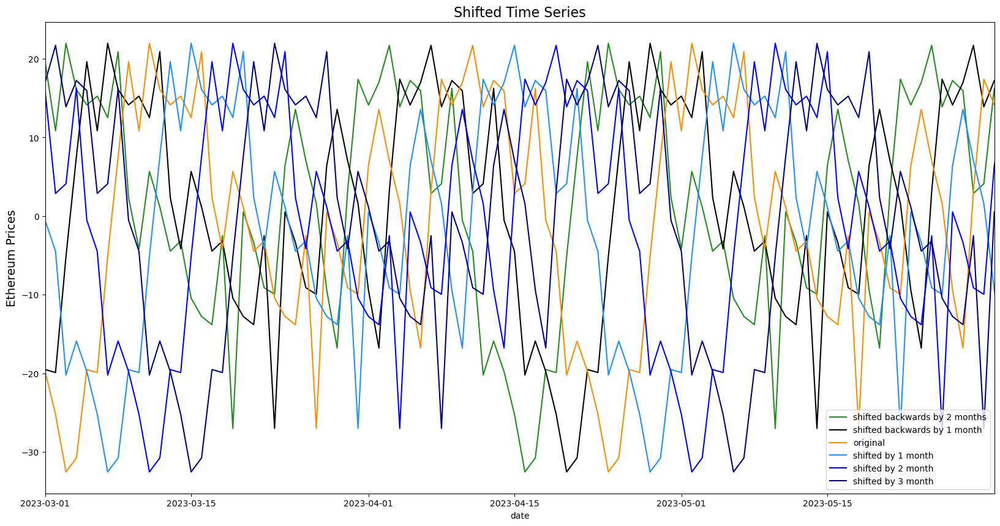

In [76]:
weeks_in_month = 4

df1['price_seasonal_shift_r_2M'] = df1.price_seasonal.shift(-2*weeks_in_month)
df1['price_seasonal_shift_r_1M'] = df1.price_seasonal.shift(-1*weeks_in_month)
df1['price_seasonal_shift_1M'] = df1.price_seasonal.shift(1*weeks_in_month)
df1['price_seasonal_shift_2M'] = df1.price_seasonal.shift(2*weeks_in_month)
df1['price_seasonal_shift_3M'] = df1.price_seasonal.shift(3*weeks_in_month)

df1['market_cap_seasonal_shift_r_2M'] = df1.market_cap_seasonal.shift(-2*weeks_in_month)
df1['market_cap_seasonal_shift_r_1M'] = df1.market_cap_seasonal.shift(-1*weeks_in_month)
df1['market_cap_seasonal_shift_1M'] = df1.market_cap_seasonal.shift(1*weeks_in_month)
df1['market_cap_seasonal_shift_2M'] = df1.market_cap_seasonal.shift(2*weeks_in_month)
df1['market_cap_seasonal_shift_3M'] = df1.market_cap_seasonal.shift(3*weeks_in_month)

df1['total_volume_seasonal_shift_r_2M'] = df1.total_volume_seasonal.shift(-2*weeks_in_month)
df1['total_volume_seasonal_shift_r_1M'] = df1.total_volume_seasonal.shift(-1*weeks_in_month)
df1['total_volume_seasonal_shift_1M'] = df1.total_volume_seasonal.shift(1*weeks_in_month)
df1['total_volume_seasonal_shift_2M'] = df1.total_volume_seasonal.shift(2*weeks_in_month)
df1['total_volume_seasonal_shift_3M'] = df1.total_volume_seasonal.shift(3*weeks_in_month)

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20,10))
sns.lineplot(x=df1.date, y=df1.price_seasonal_shift_r_2M, label='shifted backwards by 2 months', ax=ax, color='forestgreen')
sns.lineplot(x=df1.date, y=df1.price_seasonal_shift_r_1M, label='shifted backwards by 1 month', ax=ax, color='black')

sns.lineplot(x=df1.date, y=df1.price_seasonal, label='original', ax=ax, color='darkorange')

sns.lineplot(x=df1.date, y=df1.price_seasonal_shift_1M, label='shifted by 1 month', ax=ax, color='dodgerblue')
sns.lineplot(x=df1.date, y=df1.price_seasonal_shift_2M, label='shifted by 2 month', ax=ax, color='blue')
sns.lineplot(x=df1.date, y=df1.price_seasonal_shift_3M, label='shifted by 3 month', ax=ax, color='navy')

ax.set_title('Shifted Time Series', fontsize=16)

ax.set_xlim([date(2023,3,1), date(2023,5,31)])
ax.set_ylabel(ylabel='Ethereum Prices', fontsize=14)

plt.show()

From the color labels, it is evident that data shifted ahead yielded results which were almost similar to our original observation, to signofy that we expect no changed;
Inversely, shiftin backwards reveals that there was a price increase as shown by the lag values clustering aroud 0; far away from the original observation.

We carry out some DataViz to gain more insights from our dataset for informed decisions.

In this case, we want to see ithe maximum and minimum seasons/months for each field using seasonal decomposition.

Let's begin by plotting the seasonal components of each feature and comparing the minima and maxima. By doing this, we can already gain some insights:

The depth to groundwater reaches its maximum and its minimum around which months?
What about the other fields?


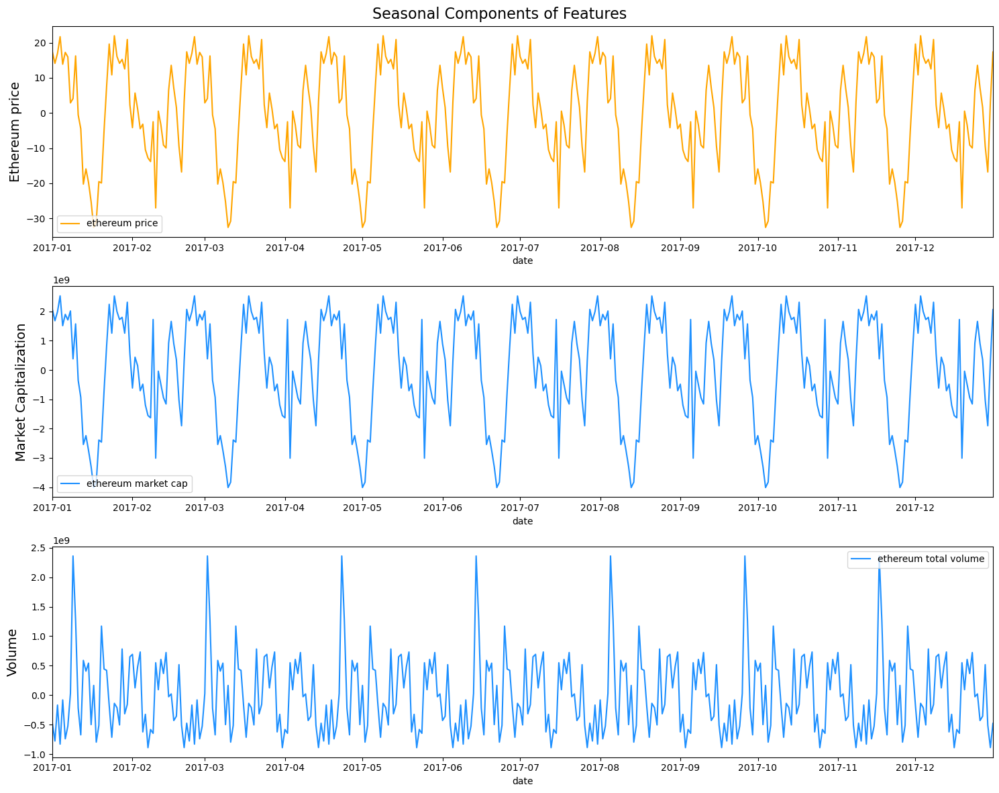

In [77]:
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 12))
f.suptitle('Seasonal Components of Features', fontsize=16)
sns.lineplot(x=df1.date, y=df1.price_seasonal, ax=ax[0], color='orange', label='ethereum price')
ax[0].set_ylabel(ylabel='Ethereum price', fontsize=14)

sns.lineplot(x=df1.date, y=df1.market_cap_seasonal, ax=ax[1], color='dodgerblue', label='ethereum market cap')
ax[1].set_ylabel(ylabel='Market Capitalization', fontsize=14)

sns.lineplot(x=df1.date, y=df1.total_volume_seasonal, ax=ax[2], color='dodgerblue', label='ethereum total volume')
ax[2].set_ylabel(ylabel='Volume', fontsize=14)


for i in range(3):
    ax[i].set_xlim([date(2017, 1,1), date(2017,12,31)])
plt.tight_layout()
plt.show()

In [78]:
!pip install prophet

Defaulting to user installation because normal site-packages is not writeable


In [79]:
from prophet import Prophet

In [80]:
df1.to_csv(r"C:\Users\USER\Desktop\ALL MY TASKS\TSI DATA SCIENCE\Datasets\CSV Datasets\eth_data.csv")

In [86]:
df = df1[["date","price"]]
df = df1[["date", "price"]].reset_index(drop=True)
df.head()

,date,price
0,2015-08-07,2.831620
1,2015-08-08,1.330750
2,2015-08-09,1000.125105
3,2015-08-10,0.687586
4,2015-08-11,1.067379


In [89]:
df= df.rename(
    columns={
        "date": "ds",
        "price": "y",
    }
)
df.head()

,ds,y
0,2015-08-07,2.831620
1,2015-08-08,1.330750
2,2015-08-09,1000.125105
3,2015-08-10,0.687586
4,2015-08-11,1.067379


In [90]:
m = Prophet()
m.fit(df)

19:38:28 - cmdstanpy - INFO - Chain [1] start processing
19:38:29 - cmdstanpy - INFO - Chain [1] done processing


In [91]:
#365 forecast steps ahead
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
3546,2025-04-22
3547,2025-04-23
3548,2025-04-24
3549,2025-04-25
3550,2025-04-26


In [92]:
# Python
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3546,2025-04-22,3640.445051,2440.796698,4760.708558
3547,2025-04-23,3645.602875,2391.745623,4851.012984
3548,2025-04-24,3655.427407,2529.410536,4873.919319
3549,2025-04-25,3658.738617,2420.927388,4875.016548
3550,2025-04-26,3661.591396,2521.457653,4871.461522


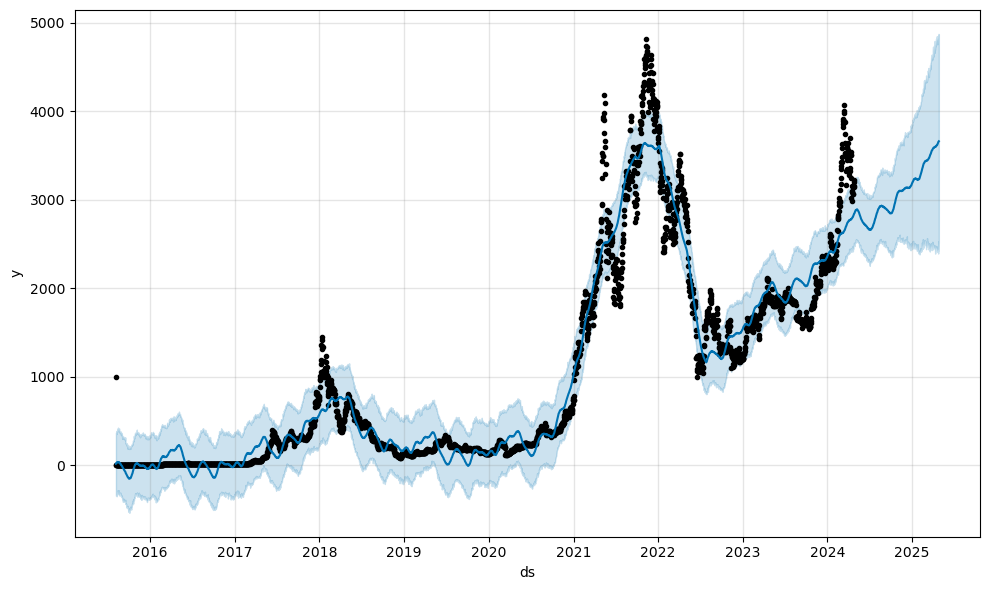

In [93]:
fig1 = m.plot(forecast)

In [94]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [95]:
plot_components_plotly(m, forecast)